In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import os
import scipy
from scipy.stats import kurtosis
import skimage as ski
from skimage.exposure import is_low_contrast

print("\nLibraries\n-----------------------------")
print(f"OpenCV: {cv2.__version__}")
print(f"Numpy: {np.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"SciPy: {scipy.__version__}")
print(f"SciKit Image: {ski.__version__}")


Libraries
-----------------------------
OpenCV: 4.7.0
Numpy: 1.22.0
Matplotlib: 3.7.0
SciPy: 1.7.3
SciKit Image: 0.19.3


In [2]:
def quantile_CI(x, q=[0.05, 0.95]):

    if not isinstance(x, (list, np.ndarray)) or len(x) == 0:

        raise ValueError("Quantile values can only be calculated on non-empty lists or arrays")

    if not isinstance(q, (list, np.ndarray)):

        raise ValueError("Quantiles must be provided as a list or array")

    if len(q) == 2:

        if not all(isinstance(quant, (int, float)) for quant in q):

            raise ValueError("Quantiles must be numeric")

        if any(quant < 0 or quant > 1 for quant in q):

            raise ValueError("Quantile values must be between 0 and 1")

        x_sorted = np.sort(x)
        lower_CI = x_sorted[int(q[0] * len(x_sorted))]
        upper_CI = x_sorted[int(q[1] * len(x_sorted))]

        return [lower_CI, upper_CI]

    elif len(q) == 1:

        if not isinstance(q[0], (int, float)):

            raise ValueError("Quantile must be numeric")

        x_sorted = np.sort(x)
        x_prima = x_sorted[int(q[0]) * len(x_sorted)]

        return x_prima

    else:

        raise ValueError("Invalid number of quantiles provided")


def descriptive_statistics(data, percentage = False):

    print(f"Shapiro results w = {shapiro(data)[0]:.2f}, p = {shapiro(data)[1]}")

    if percentage:
        
        if shapiro(data)[1] < 0.003:
            
            quantile_ranges = quantile_CI(data, [0.025, 0.975])
            
            print(f"\nMedian: {np.median(data):.3f} %")
            print(f"NMAD: {(median_abs_deviation(data) * 1.4826):.3f}")
            
        else:
            
            print(f"\nMean: {np.mean(data):.3f}%")
            print(f"Standard Deviation: {np.std(data):.3f}")

        print(
            f"95% Quantile Intevals: [{quantile_ranges[0]:.2f},",
            f"{quantile_ranges[1]:.2f}] %"
        )

    else:

        print(f"\nMin: {np.min(data):.2f}")

        if shapiro(data)[1] < 0.003:
            
            quantile_ranges = quantile_CI(data, [0.025, 0.975])
            
            print(f"Median: {np.median(data):.3f}")
            print(f"NMAD: {(median_abs_deviation(data) * 1.4826):.3f}")
            
        else:
            
            print(f"\nMean: {np.mean(data):.3f}")
            print(f"Standard Deviation: {np.std(data):.3f}")

        print(
            f"95% Quantile Intevals: [{quantile_ranges[0]:.2f}",
            f", {quantile_ranges[1]:.2f}]"
        )
        print(f"Max: {np.max(data):.2f}")

class loadImage():

    def __init__(self, image):

        self.image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

class LaplacianAnalysis(loadImage):

    def __init__(self, image):

        super().__init__(image)

        gaussian_blur = cv2.GaussianBlur(self.image, (5, 5), 0)
        self.laplacian_map = cv2.Laplacian(gaussian_blur, cv2.CV_64F, ksize = 3)
        self.laplacian_vector = self.laplacian_map.ravel()

        self.threshold = quantile_CI(np.abs(self.laplacian_vector), [0, 0.66]) [1]
    
    def calculate_variance(self):

        return(self.laplacian_vector.var())
    
    def calculate_quantile_range(self):

        interquantile_range = quantile_CI(
            self.laplacian_vector, [0.025, 0.975]
        )[1] - quantile_CI(
            self.laplacian_vector, [0.025, 0.975]
        )[0]

        return(interquantile_range)
    
    def binary_map(self):
        
        binary_matrix = (np.abs(self.laplacian_map) > self.threshold).astype(int)
        
        return(binary_matrix)
 

class CannyEdgeAnalysis(loadImage):

    def __init__(self, image):

        super().__init__(image)

        gaussian_blur = cv2.GaussianBlur(self.image, (5, 5), 0)
        self.edges = cv2.Canny(gaussian_blur, 10, 20)
    
    def calculate_features(self):

        dilate_kernel = np.ones((3, 3), np.uint8)
        dilated_edges = cv2.dilate(self.edges, dilate_kernel, iterations = 1)
        perc_detectable_features = (
            np.sum(dilated_edges.ravel() > 1) / dilated_edges.ravel().shape[0]
        ) * 100

        return(perc_detectable_features)

class FastFourierTransform(loadImage):

    def calculate_FFT(self, size = 60):
        
        h, w = self.image.shape
        cX, cY = (int(w / 2), int(h / 2))
        
        fft = np.fft.fft2(self.image)
        fftShift = np.fft.fftshift(fft)
        
        fftShift[cY - size:cY + size, cX - size:cX + size] = 0
        fftShift = np.fft.ifftshift(fftShift)
        
        recon = np.fft.ifft2(fftShift)
        
        magnitude = 20 * np.log(np.abs(recon))
        
        return(np.mean(magnitude))

class SobelGradientMaps(loadImage):

    def __init__(self, image):

        super().__init__(image)

        self.sobel_x = cv2.Sobel(self.image, cv2.CV_64F, 1, 0)
        self.sobel_y = cv2.Sobel(self.image, cv2.CV_64F, 0, 1)

    def gradient_map(self):

        return(cv2.addWeighted(self.sobel_x, 0.5, self.sobel_y, 0.5, 0))
    
    def scaled_gradient_map(self):

        gX = cv2.convertScaleAbs(self.sobel_x)
        gY = cv2.convertScaleAbs(self.sobel_y)

        return(cv2.addWeighted(gX, 0.5, gY, 0.5, 0))

# Reference Example of the Properties of Reference Images taken with the entire Image in focus, and a percentage of the image out of focus

## 1st Example of Image In Focus
### Laplacian of Gaussian Gradients, Canny Edge Detection, Fast Fourier Transform Calcualtions & Image Contrast Adequacy

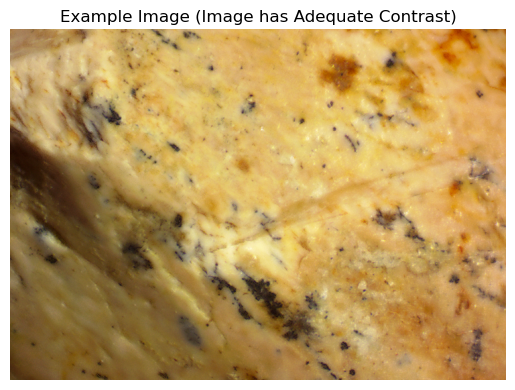

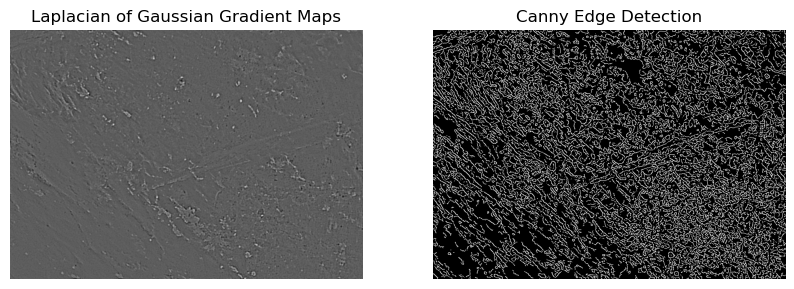

Laplacian Gradient Variance: 114.21
62.14% of image presenting detectable features


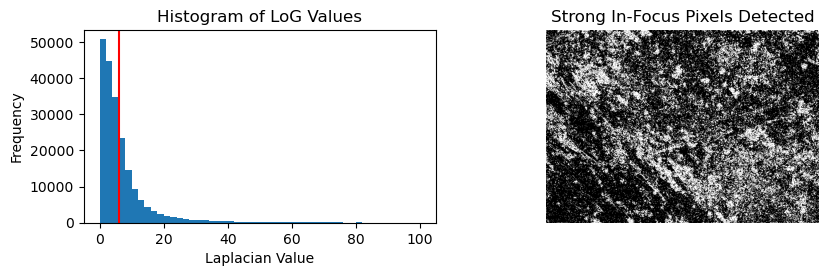

FFT Mean Magnitude Representation: 16.89


In [3]:
image = cv2.imread("./Focus Analysis/All Focus Image.PNG", cv2.IMREAD_COLOR)
low_contrast_bool = is_low_contrast(loadImage(image).image, fraction_threshold = 0.35)
if low_contrast_bool:
    message = "Image has Inadequate Contrast"
else:
    message = "Image has Adequate Contrast"

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f"Example Image ({message})")
plt.show()

laplace = LaplacianAnalysis(image)
canny = CannyEdgeAnalysis(image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(laplace.laplacian_map , cmap = "gray")
plt.title("Laplacian of Gaussian Gradient Maps")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(canny.edges, cmap = "gray")
plt.title("Canny Edge Detection")
plt.axis('off')
plt.show()

print(f"Laplacian Gradient Variance: {laplace.calculate_variance():.2f}")
print(f"{canny.calculate_features():.2f}% of image presenting detectable features")

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.hist(laplace.laplacian_vector,
        bins = 50, range = [0, 100])
plt.xlabel("Laplacian Value")
plt.ylabel("Frequency")
plt.title("Histogram of LoG Values")
plt.axvline(x = laplace.threshold, color = "red")
plt.subplot(1, 2, 2)
plt.imshow(laplace.binary_map(), cmap = "gray")
plt.title("Strong In-Focus Pixels Detected")
plt.axis("off")
plt.show()

FFT = FastFourierTransform(image)
print(f"FFT Mean Magnitude Representation: {FFT.calculate_FFT():.2f}")

### Sobel Gradient Maps

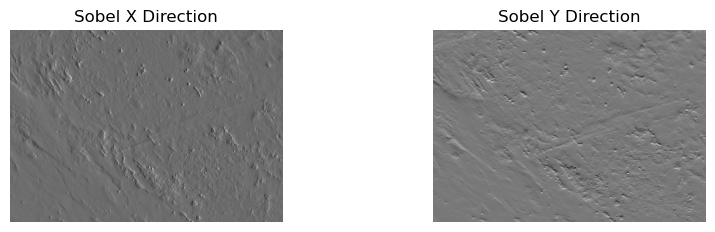

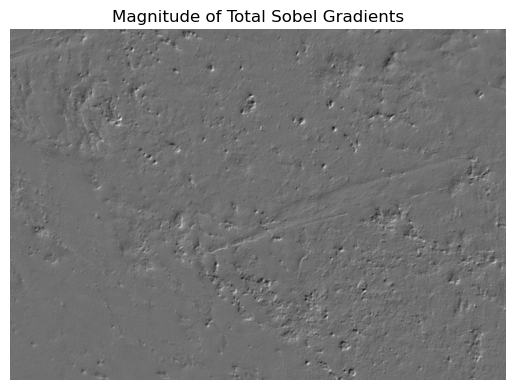

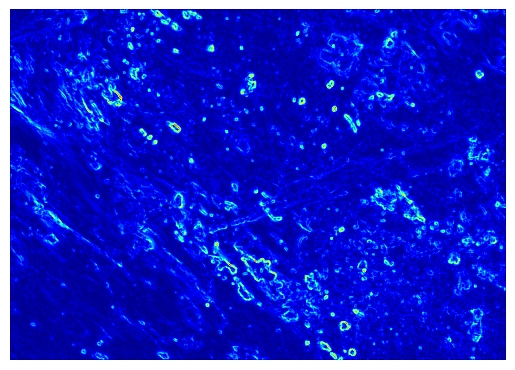

In [4]:
sobel = SobelGradientMaps(image)

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.imshow(sobel.sobel_x, cmap = "gray")
plt.axis("off")
plt.title("Sobel X Direction")
plt.subplot(1, 2, 2)
plt.imshow(sobel.sobel_y, cmap = "gray")
plt.axis("off")
plt.title("Sobel Y Direction")
plt.show()

plt.imshow(sobel.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("Magnitude of Total Sobel Gradients")
plt.show()

plt.imshow(sobel.scaled_gradient_map(), cmap = "jet")
plt.axis("off")
plt.show()

## 1st Example of Image Partially Out of Focus
### Laplacian of Gaussian Gradients, Canny Edge Detection & Fast Fourier Transform Calcualtions

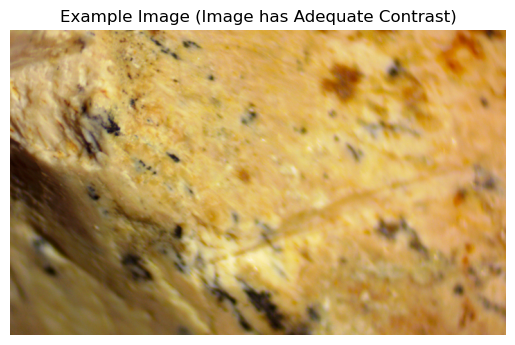

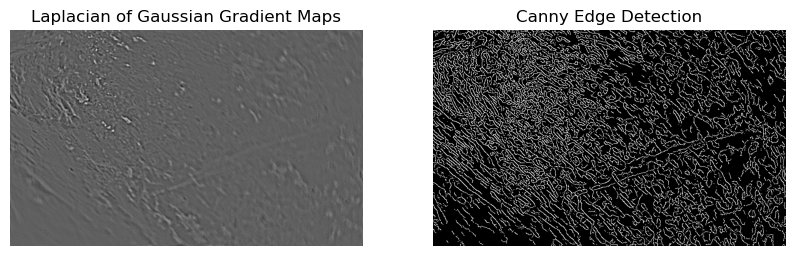

Laplacian Gradient Variance: 78.34
54.45% of image presenting detectable features


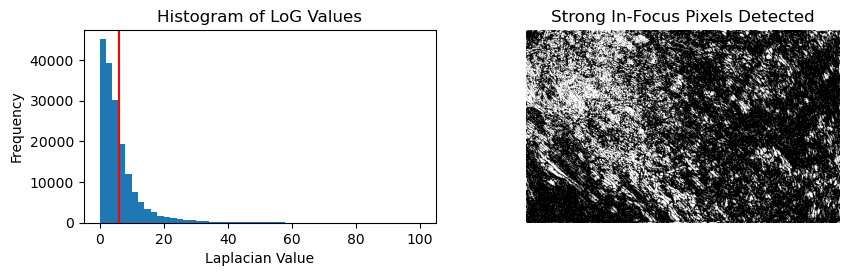

FFT Mean Magnitude Representation: 8.84


In [5]:
image = cv2.imread("./Focus Analysis/Out of Focus 3.PNG", cv2.IMREAD_COLOR)
low_contrast_bool = is_low_contrast(loadImage(image).image, fraction_threshold = 0.35)
if low_contrast_bool:
    message = "Image has Inadequate Contrast"
else:
    message = "Image has Adequate Contrast"

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f"Example Image ({message})")
plt.show()

laplace = LaplacianAnalysis(image)
canny = CannyEdgeAnalysis(image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(laplace.laplacian_map, cmap = "gray")
plt.title("Laplacian of Gaussian Gradient Maps")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(canny.edges, cmap = "gray")
plt.title("Canny Edge Detection")
plt.axis('off')
plt.show()

print(f"Laplacian Gradient Variance: {laplace.calculate_variance():.2f}")
print(f"{canny.calculate_features():.2f}% of image presenting detectable features")

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.hist(laplace.laplacian_vector,
        bins = 50, range = [0, 100])
plt.xlabel("Laplacian Value")
plt.ylabel("Frequency")
plt.title("Histogram of LoG Values")
plt.axvline(x = laplace.threshold, color = "red")
plt.subplot(1, 2, 2)
plt.imshow(laplace.binary_map(), cmap = "gray")
plt.title("Strong In-Focus Pixels Detected")
plt.axis("off")
plt.show()

FFT = FastFourierTransform(image)
print(f"FFT Mean Magnitude Representation: {FFT.calculate_FFT():.2f}")

### Sobel Gradient Maps

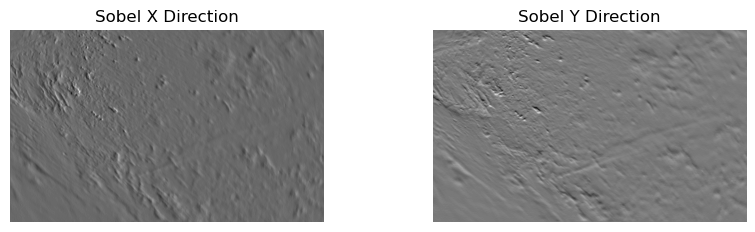

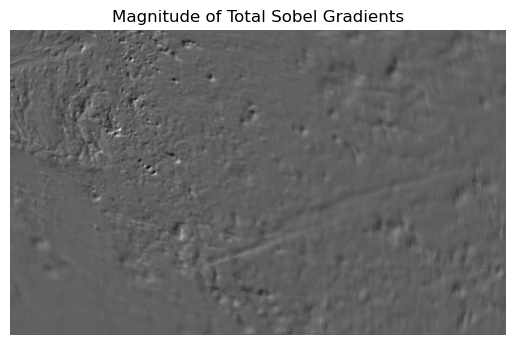

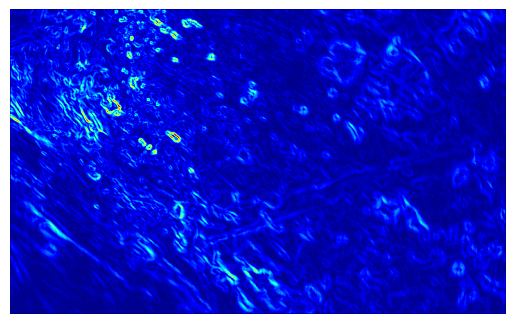

In [6]:
sobel = SobelGradientMaps(image)

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.imshow(sobel.sobel_x, cmap = "gray")
plt.axis("off")
plt.title("Sobel X Direction")
plt.subplot(1, 2, 2)
plt.imshow(sobel.sobel_y, cmap = "gray")
plt.axis("off")
plt.title("Sobel Y Direction")
plt.show()

plt.imshow(sobel.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("Magnitude of Total Sobel Gradients")
plt.show()

plt.imshow(sobel.scaled_gradient_map(), cmap = "jet")
plt.axis("off")
plt.show()

# Comparing Sobel Gradient Maps

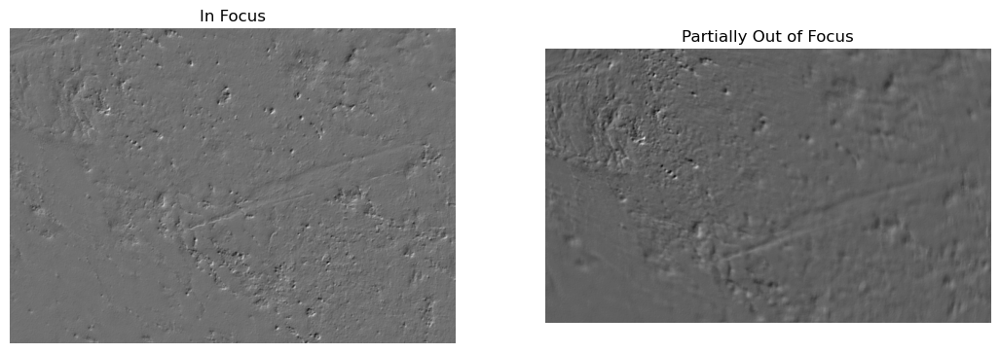

In [7]:
sobel_in_focus = SobelGradientMaps(
    cv2.imread("./Focus Analysis/All Focus Image.PNG", cv2.IMREAD_COLOR)
)
sobel_out_focus = SobelGradientMaps(
    cv2.imread("./Focus Analysis/Out of Focus 3.PNG", cv2.IMREAD_COLOR)
)

plt.figure(figsize = (13, 7))
plt.subplot(1, 2, 1)
plt.imshow(sobel_in_focus.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("In Focus")
plt.subplot(1, 2, 2)
plt.imshow(sobel_out_focus.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("Partially Out of Focus")
plt.show()

# Comparing histograms of Laplacian of Gaussian gradient values

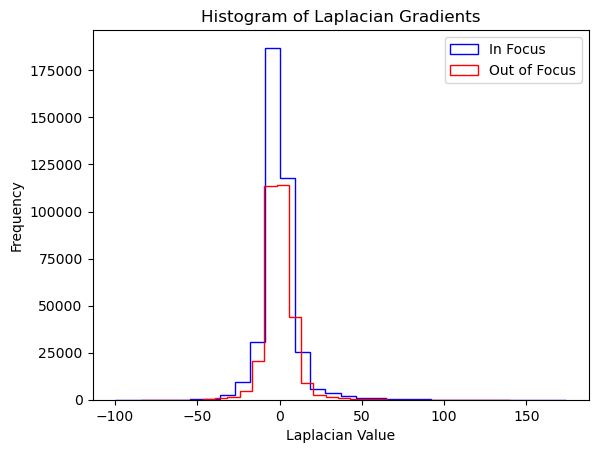

In Focus Range: 44.0
Out of Focus Range: 34.0
In Focus Variance: 114.21
Out of Focus Variance: 78.34


In [8]:
laplace_in_focus = LaplacianAnalysis(
    cv2.imread("./Focus Analysis/All Focus Image.PNG", cv2.IMREAD_COLOR)
)
laplace_out_focus = LaplacianAnalysis(
    cv2.imread("./Focus Analysis/Out of Focus 3.PNG", cv2.IMREAD_COLOR)
)

plt.hist(laplace_in_focus.laplacian_vector, bins=30,
        histtype = "step", color = "b", label = "In Focus")
plt.hist(laplace_out_focus.laplacian_vector, bins=30,
        histtype = "step", color = "r", label = "Out of Focus")
plt.title('Histogram of Laplacian Gradients')
plt.xlabel('Laplacian Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

print(f"In Focus Range: {laplace_in_focus.calculate_quantile_range()}")
print(f"Out of Focus Range: {laplace_out_focus.calculate_quantile_range()}")
print(f"In Focus Variance: {laplace_in_focus.calculate_variance():.2f}")
print(f"Out of Focus Variance: {laplace_out_focus.calculate_variance():.2f}")

## 2nd Example of Image In Focus
### Laplacian of Gaussian Gradients, Canny Edge Detection & Fast Fourier Transform Calcualtions

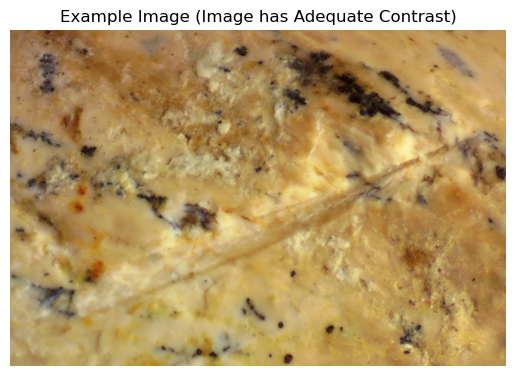

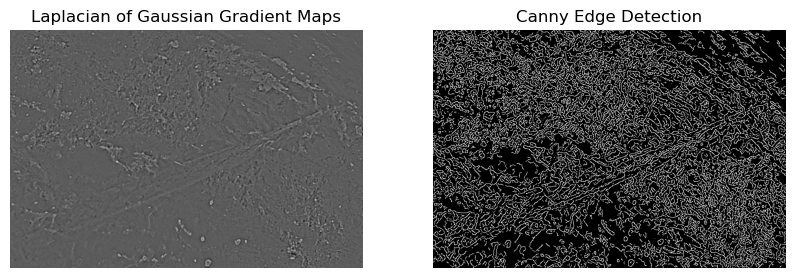

Laplacian Gradient Variance: 133.98
63.50% of image presenting detectable features


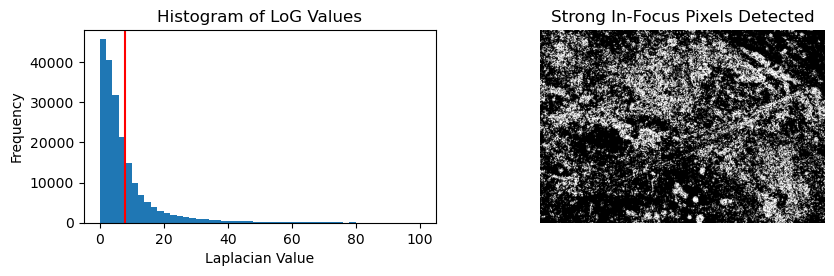

FFT Mean Magnitude Representation: 16.86


In [9]:
image = cv2.imread("./Focus Analysis/All Focus Image 2.PNG", cv2.IMREAD_COLOR)
low_contrast_bool = is_low_contrast(loadImage(image).image, fraction_threshold = 0.35)
if low_contrast_bool:
    message = "Image has Inadequate Contrast"
else:
    message = "Image has Adequate Contrast"

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f"Example Image ({message})")
plt.show()

laplace = LaplacianAnalysis(image)
canny = CannyEdgeAnalysis(image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(laplace.laplacian_map , cmap = "gray")
plt.title("Laplacian of Gaussian Gradient Maps")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(canny.edges, cmap = "gray")
plt.title("Canny Edge Detection")
plt.axis('off')
plt.show()

print(f"Laplacian Gradient Variance: {laplace.calculate_variance():.2f}")
print(f"{canny.calculate_features():.2f}% of image presenting detectable features")

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.hist(laplace.laplacian_vector,
        bins = 50, range = [0, 100])
plt.xlabel("Laplacian Value")
plt.ylabel("Frequency")
plt.title("Histogram of LoG Values")
plt.axvline(x = laplace.threshold, color = "red")
plt.subplot(1, 2, 2)
plt.imshow(laplace.binary_map(), cmap = "gray")
plt.title("Strong In-Focus Pixels Detected")
plt.axis("off")
plt.show()

FFT = FastFourierTransform(image)
print(f"FFT Mean Magnitude Representation: {FFT.calculate_FFT():.2f}")

### Sobel Gradient Maps

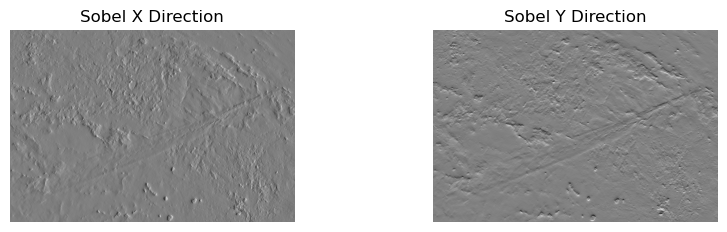

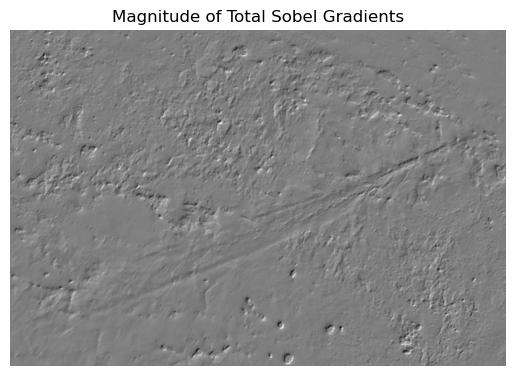

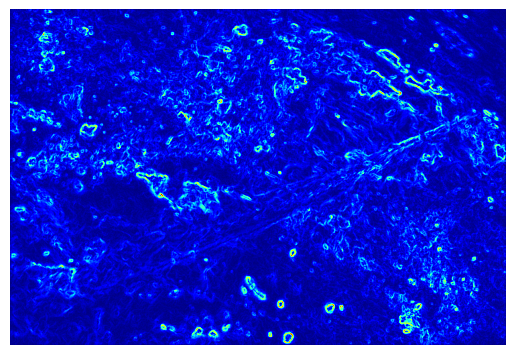

In [10]:
sobel = SobelGradientMaps(image)

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.imshow(sobel.sobel_x, cmap = "gray")
plt.axis("off")
plt.title("Sobel X Direction")
plt.subplot(1, 2, 2)
plt.imshow(sobel.sobel_y, cmap = "gray")
plt.axis("off")
plt.title("Sobel Y Direction")
plt.show()

plt.imshow(sobel.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("Magnitude of Total Sobel Gradients")
plt.show()

plt.imshow(sobel.scaled_gradient_map(), cmap = "jet")
plt.axis("off")
plt.show()

## 1st Example of Image Partially Out of Focus
### Laplacian of Gaussian Gradients, Canny Edge Detection & Fast Fourier Transform Calcualtions

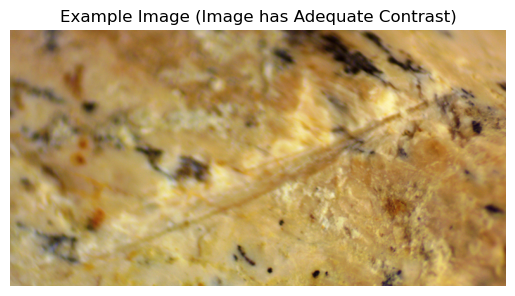

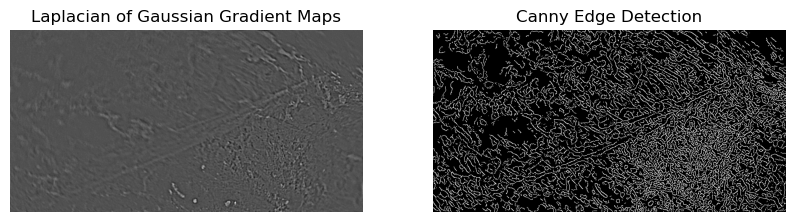

Laplacian Gradient Variance: 79.22
55.27% of image presenting detectable features


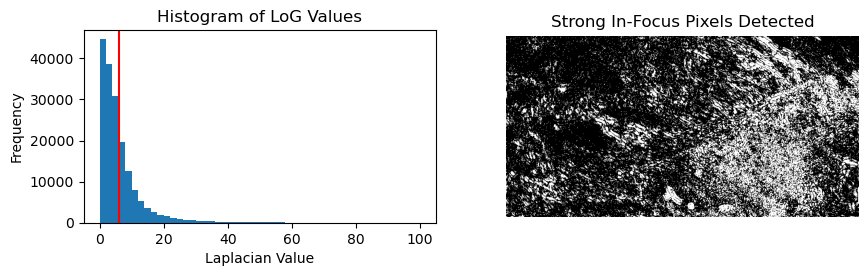

FFT Mean Magnitude Representation: 9.13


In [11]:
image = cv2.imread("./Focus Analysis/Out of Focus 2_2.PNG", cv2.IMREAD_COLOR)
low_contrast_bool = is_low_contrast(loadImage(image).image, fraction_threshold = 0.35)
if low_contrast_bool:
    message = "Image has Inadequate Contrast"
else:
    message = "Image has Adequate Contrast"

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f"Example Image ({message})")
plt.show()

laplace = LaplacianAnalysis(image)
canny = CannyEdgeAnalysis(image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(laplace.laplacian_map, cmap = "gray")
plt.title("Laplacian of Gaussian Gradient Maps")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(canny.edges, cmap = "gray")
plt.title("Canny Edge Detection")
plt.axis('off')
plt.show()

print(f"Laplacian Gradient Variance: {laplace.calculate_variance():.2f}")
print(f"{canny.calculate_features():.2f}% of image presenting detectable features")

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.hist(laplace.laplacian_vector,
        bins = 50, range = [0, 100])
plt.xlabel("Laplacian Value")
plt.ylabel("Frequency")
plt.title("Histogram of LoG Values")
plt.axvline(x = laplace.threshold, color = "red")
plt.subplot(1, 2, 2)
plt.imshow(laplace.binary_map(), cmap = "gray")
plt.title("Strong In-Focus Pixels Detected")
plt.axis("off")
plt.show()

FFT = FastFourierTransform(image)
print(f"FFT Mean Magnitude Representation: {FFT.calculate_FFT():.2f}")

### Sobel Gradient Maps

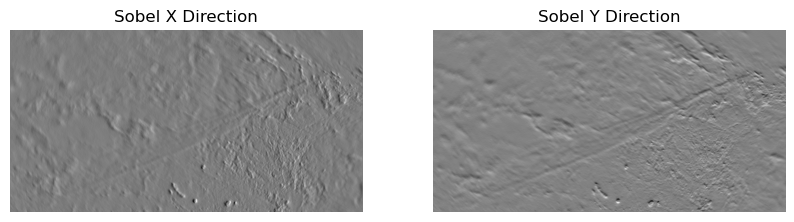

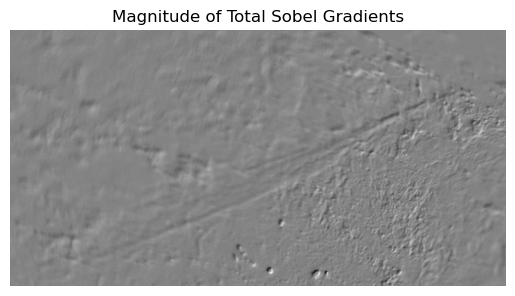

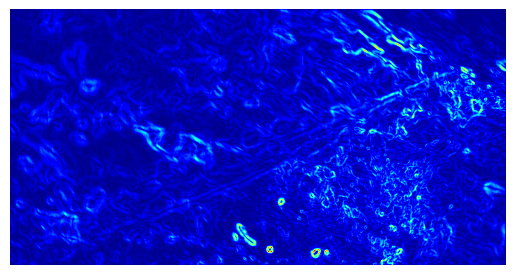

In [12]:
sobel = SobelGradientMaps(image)

plt.figure(figsize = (10, 2.5))
plt.subplot(1, 2, 1)
plt.imshow(sobel.sobel_x, cmap = "gray")
plt.axis("off")
plt.title("Sobel X Direction")
plt.subplot(1, 2, 2)
plt.imshow(sobel.sobel_y, cmap = "gray")
plt.axis("off")
plt.title("Sobel Y Direction")
plt.show()

plt.imshow(sobel.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("Magnitude of Total Sobel Gradients")
plt.show()

plt.imshow(sobel.scaled_gradient_map(), cmap = "jet")
plt.axis("off")
plt.show()

# Comparing Sobel Gradient Maps

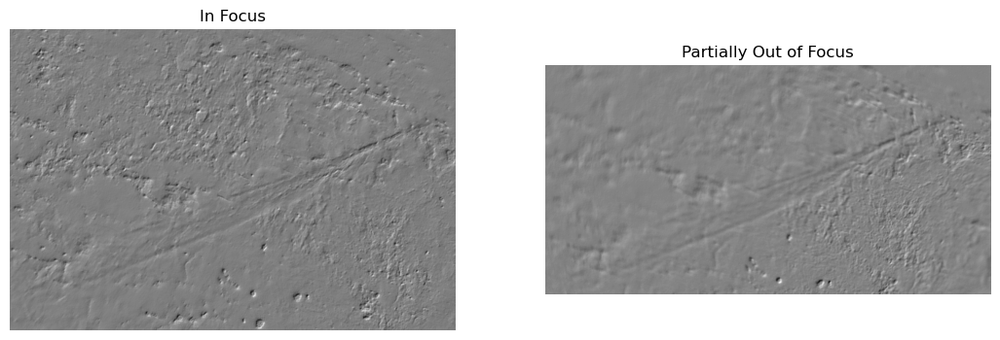

In [13]:
sobel_in_focus = SobelGradientMaps(
    cv2.imread("./Focus Analysis/All Focus Image 2.PNG", cv2.IMREAD_COLOR)
)
sobel_out_focus = SobelGradientMaps(
    cv2.imread("./Focus Analysis/Out of Focus 2_2.PNG", cv2.IMREAD_COLOR)
)

plt.figure(figsize = (13, 7))
plt.subplot(1, 2, 1)
plt.imshow(sobel_in_focus.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("In Focus")
plt.subplot(1, 2, 2)
plt.imshow(sobel_out_focus.gradient_map(), cmap = "gray")
plt.axis("off")
plt.title("Partially Out of Focus")
plt.show()

# Comparing histograms of Laplacian of Gaussian gradient values

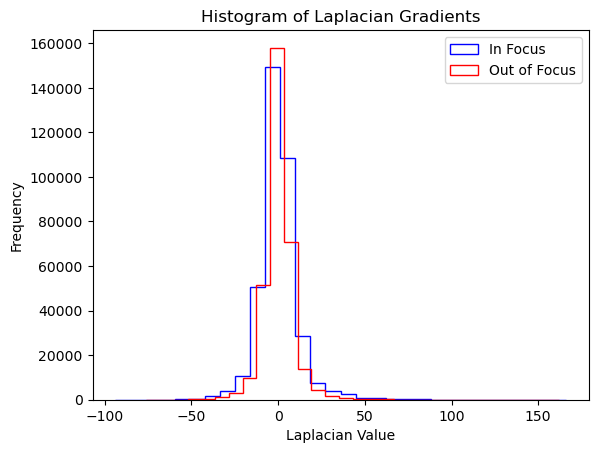

In Focus Range: 48.0
Out of Focus Range: 36.0
In Focus Variance: 133.98
Out of Focus Variance: 79.22


In [14]:
laplace_in_focus = LaplacianAnalysis(
    cv2.imread("./Focus Analysis/All Focus Image 2.PNG", cv2.IMREAD_COLOR)
)
laplace_out_focus = LaplacianAnalysis(
    cv2.imread("./Focus Analysis/Out of Focus 2_2.PNG", cv2.IMREAD_COLOR)
)

plt.hist(laplace_in_focus.laplacian_vector, bins=30,
        histtype = "step", color = "b", label = "In Focus")
plt.hist(laplace_out_focus.laplacian_vector, bins=30,
        histtype = "step", color = "r", label = "Out of Focus")
plt.title('Histogram of Laplacian Gradients')
plt.xlabel('Laplacian Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

print(f"In Focus Range: {laplace_in_focus.calculate_quantile_range()}")
print(f"Out of Focus Range: {laplace_out_focus.calculate_quantile_range()}")
print(f"In Focus Variance: {laplace_in_focus.calculate_variance():.2f}")
print(f"Out of Focus Variance: {laplace_out_focus.calculate_variance():.2f}")

# Experimentally blurring image to see effects of focus on variables

### 1st Example

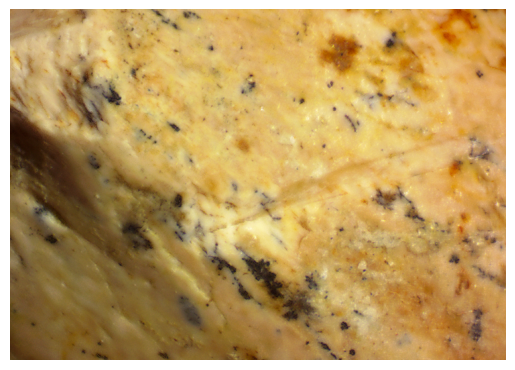

FFT Magnitude: 16.89, LoG Variance: 114.21, LoG Range: 44.00, % Features: 62.14
Indequate Contrast? False


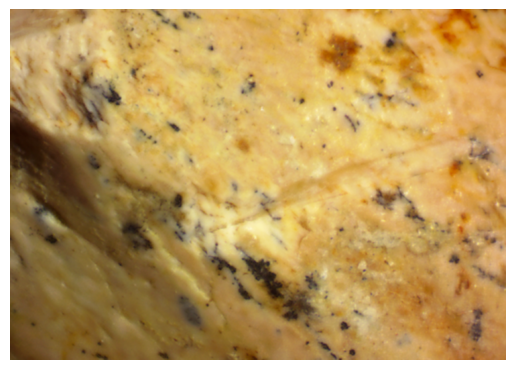

FFT Magnitude: 10.46, LoG Variance: 75.60, LoG Range: 36.00, % Features: 54.10
Indequate Contrast? False


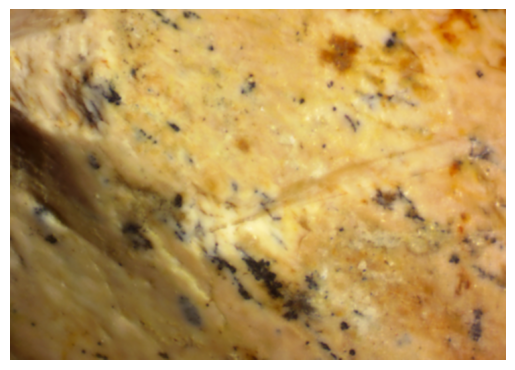

FFT Magnitude: 7.24, LoG Variance: 56.14, LoG Range: 30.00, % Features: 48.55
Indequate Contrast? False


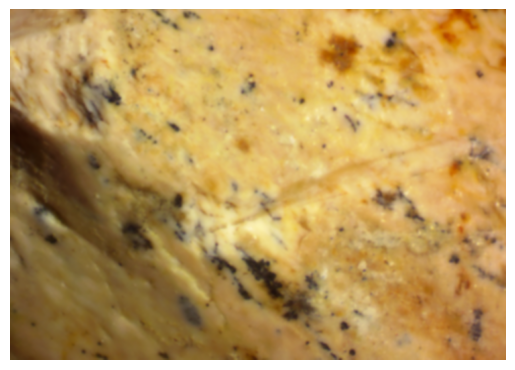

FFT Magnitude: 2.85, LoG Variance: 38.27, LoG Range: 24.00, % Features: 41.84
Indequate Contrast? False


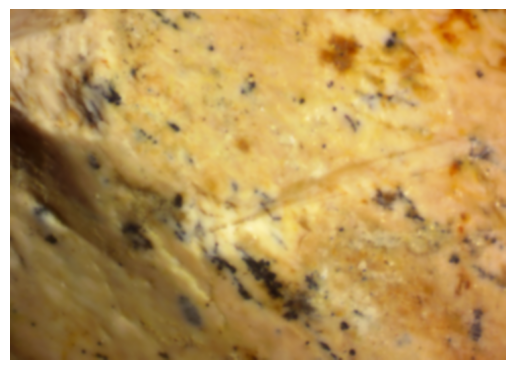

FFT Magnitude: -0.60, LoG Variance: 29.48, LoG Range: 22.00, % Features: 37.64
Indequate Contrast? False


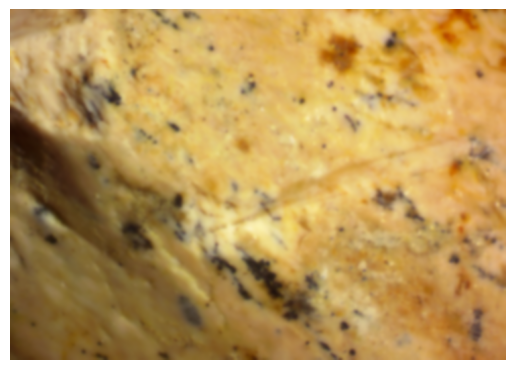

FFT Magnitude: -4.02, LoG Variance: 23.33, LoG Range: 18.00, % Features: 34.14
Indequate Contrast? False


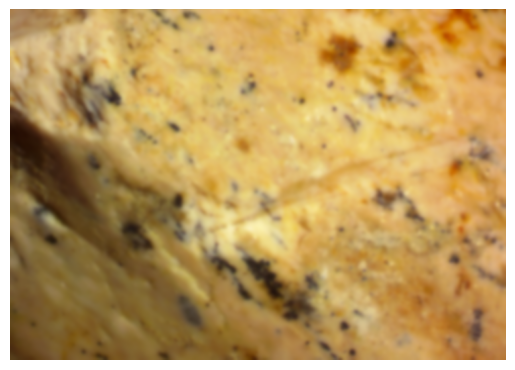

FFT Magnitude: -7.42, LoG Variance: 18.76, LoG Range: 18.00, % Features: 30.74
Indequate Contrast? False


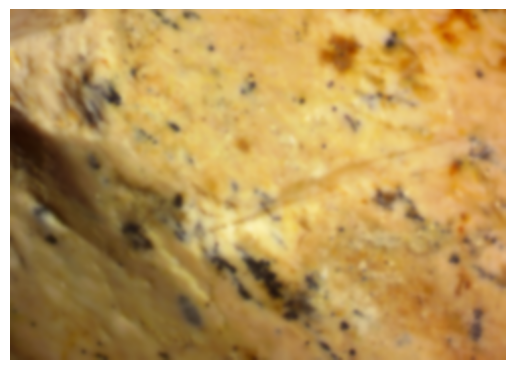

FFT Magnitude: -10.09, LoG Variance: 15.90, LoG Range: 16.00, % Features: 28.55
Indequate Contrast? False


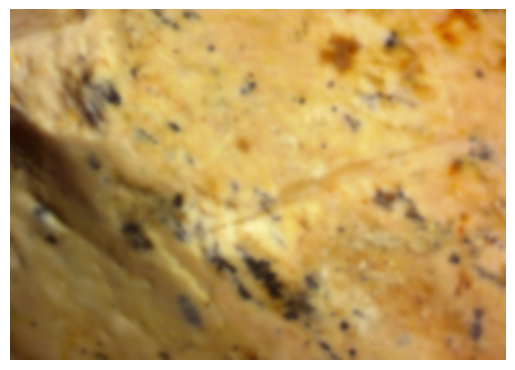

FFT Magnitude: -12.28, LoG Variance: 13.75, LoG Range: 14.00, % Features: 26.40
Indequate Contrast? False


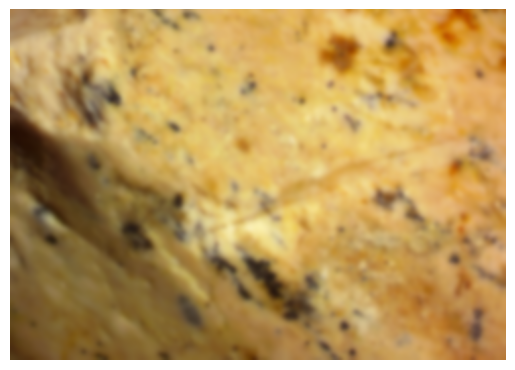

FFT Magnitude: -14.14, LoG Variance: 12.12, LoG Range: 14.00, % Features: 24.75
Indequate Contrast? False


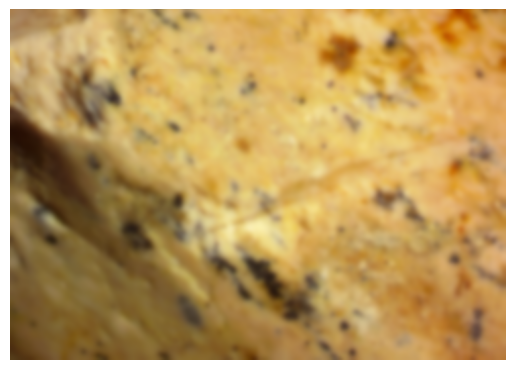

FFT Magnitude: -15.10, LoG Variance: 11.03, LoG Range: 12.00, % Features: 23.03
Indequate Contrast? False


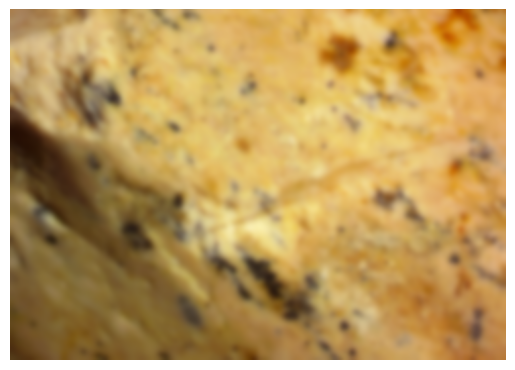

FFT Magnitude: -15.94, LoG Variance: 10.07, LoG Range: 12.00, % Features: 21.40
Indequate Contrast? False


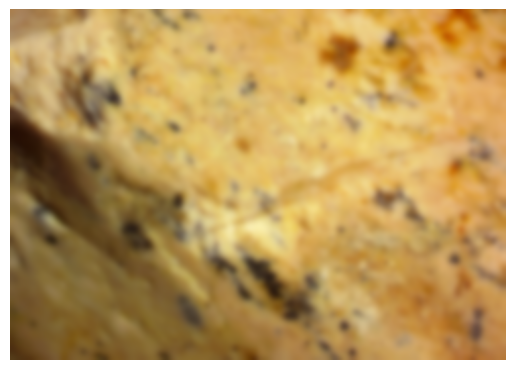

FFT Magnitude: -16.35, LoG Variance: 9.42, LoG Range: 12.00, % Features: 20.37
Indequate Contrast? False


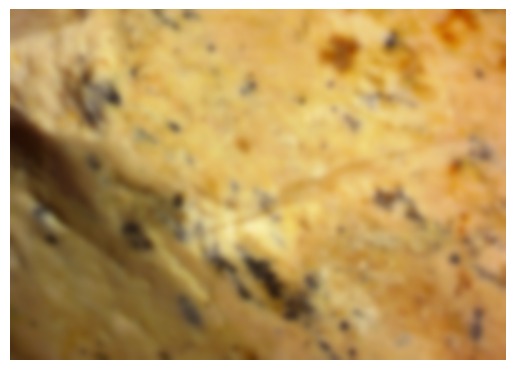

FFT Magnitude: -16.57, LoG Variance: 8.87, LoG Range: 12.00, % Features: 19.68
Indequate Contrast? False


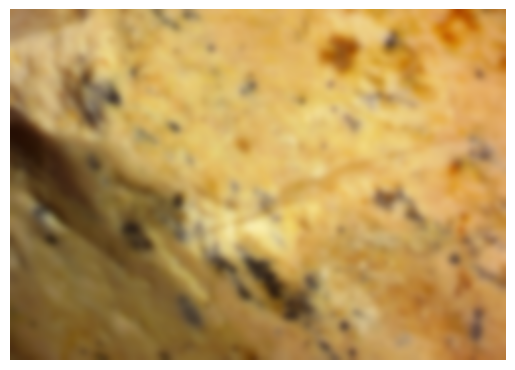

FFT Magnitude: -16.66, LoG Variance: 8.51, LoG Range: 12.00, % Features: 18.95
Indequate Contrast? False


In [15]:
image = cv2.imread("./Focus Analysis/All Focus Image.PNG", cv2.IMREAD_COLOR)

for radius in range(1, 30, 2):
    target = image.copy()
    if radius > 0:
        new_image = cv2.GaussianBlur(target, (radius, radius), 0)
        
    FFT = FastFourierTransform(new_image)
    canny = CannyEdgeAnalysis(new_image)
    laplace = LaplacianAnalysis(new_image)
    
    mag = FFT.calculate_FFT()
    var = laplace.calculate_variance()
    qr = laplace.calculate_quantile_range()
    perc = canny.calculate_features()

    plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()
    print(
        f"FFT Magnitude: {mag:.2f}, LoG Variance: {var:.2f},",
        f"LoG Range: {qr:.2f}, % Features: {perc:.2f}"
    )
    print(
        f"Indequate Contrast?",
        f"{is_low_contrast(loadImage(image).image, fraction_threshold = 0.35)}"
    )

### 2nd Example

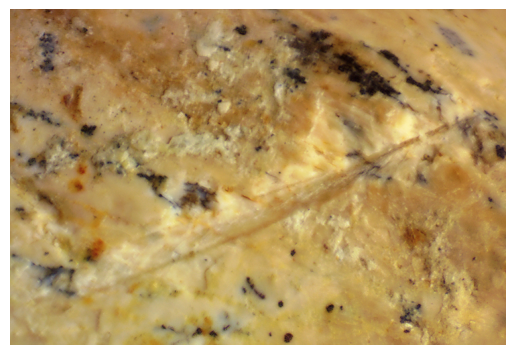

FFT Magnitude: 16.86, LoG Variance: 133.98, LoG Range: 48.00, % Features: 63.50
Indequate Contrast? False


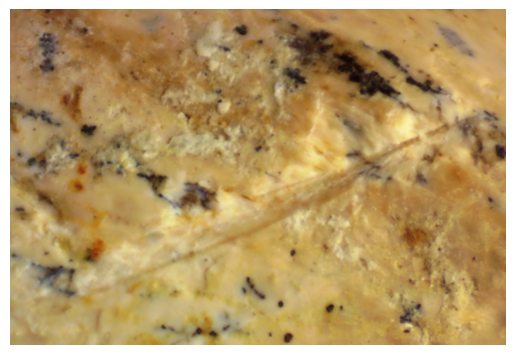

FFT Magnitude: 11.36, LoG Variance: 90.44, LoG Range: 40.00, % Features: 56.73
Indequate Contrast? False


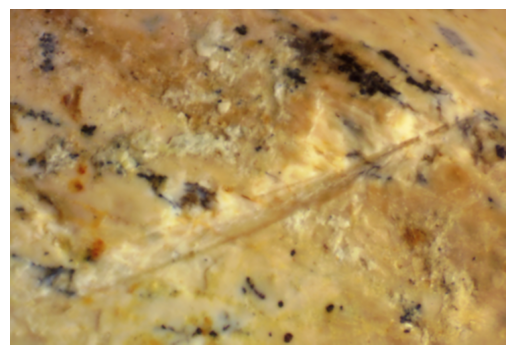

FFT Magnitude: 8.09, LoG Variance: 67.64, LoG Range: 34.00, % Features: 52.17
Indequate Contrast? False


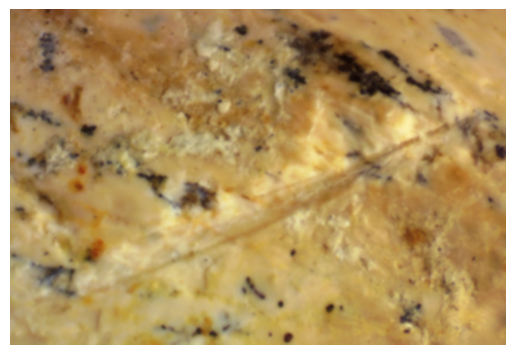

FFT Magnitude: 3.32, LoG Variance: 46.27, LoG Range: 28.00, % Features: 46.12
Indequate Contrast? False


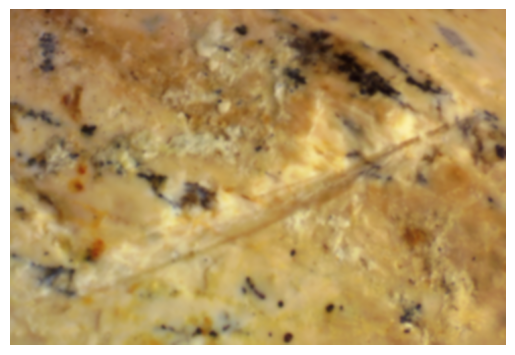

FFT Magnitude: -0.55, LoG Variance: 35.50, LoG Range: 24.00, % Features: 42.27
Indequate Contrast? False


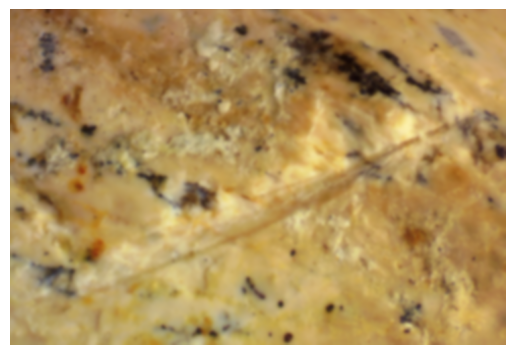

FFT Magnitude: -4.62, LoG Variance: 27.86, LoG Range: 22.00, % Features: 38.29
Indequate Contrast? False


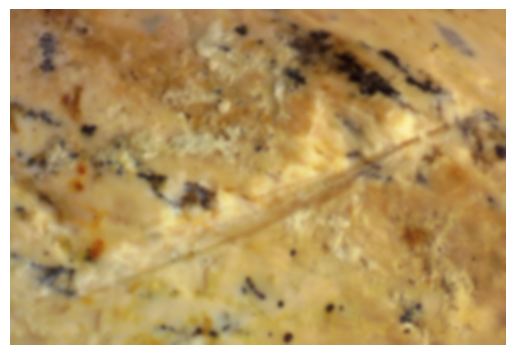

FFT Magnitude: -9.04, LoG Variance: 22.10, LoG Range: 18.00, % Features: 35.14
Indequate Contrast? False


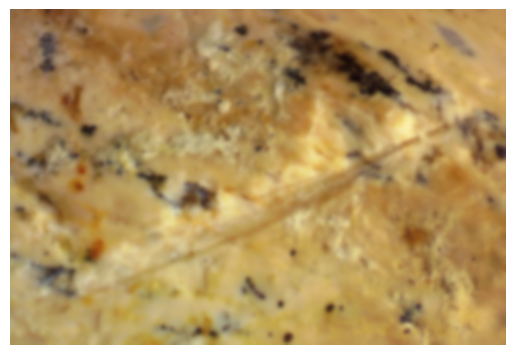

FFT Magnitude: -12.77, LoG Variance: 18.40, LoG Range: 18.00, % Features: 32.39
Indequate Contrast? False


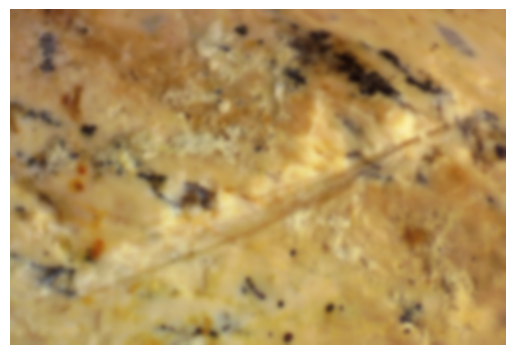

FFT Magnitude: -16.20, LoG Variance: 15.68, LoG Range: 16.00, % Features: 30.17
Indequate Contrast? False


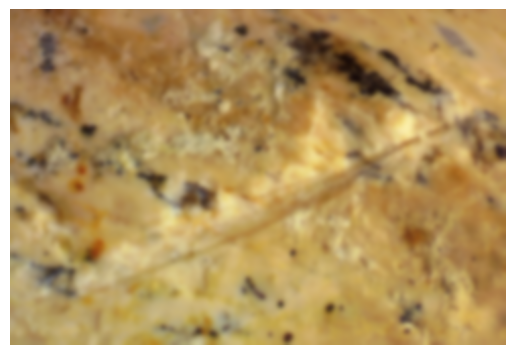

FFT Magnitude: -19.43, LoG Variance: 13.59, LoG Range: 14.00, % Features: 28.18
Indequate Contrast? False


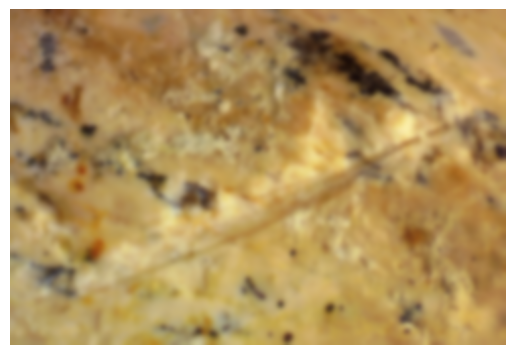

FFT Magnitude: -21.27, LoG Variance: 12.17, LoG Range: 14.00, % Features: 26.47
Indequate Contrast? False


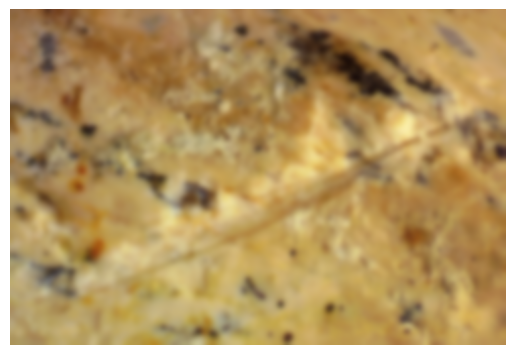

FFT Magnitude: -22.97, LoG Variance: 10.98, LoG Range: 12.00, % Features: 24.78
Indequate Contrast? False


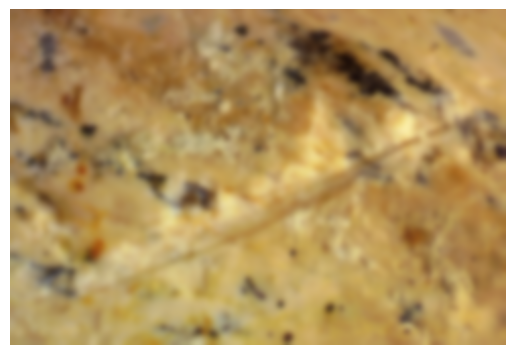

FFT Magnitude: -23.85, LoG Variance: 10.13, LoG Range: 12.00, % Features: 23.59
Indequate Contrast? False


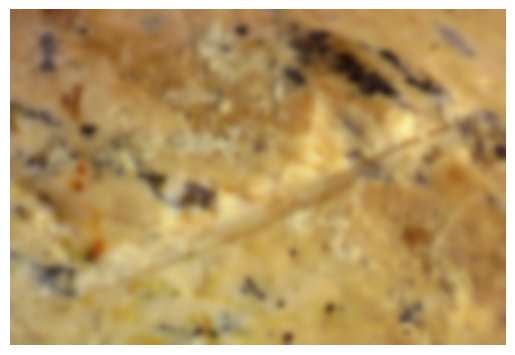

FFT Magnitude: -24.22, LoG Variance: 9.45, LoG Range: 12.00, % Features: 22.33
Indequate Contrast? False


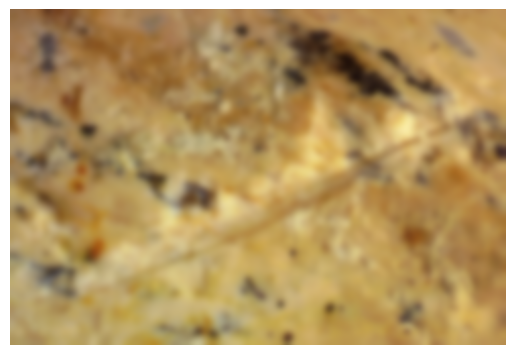

FFT Magnitude: -24.48, LoG Variance: 8.94, LoG Range: 12.00, % Features: 21.25
Indequate Contrast? False


In [16]:
image = cv2.imread("./Focus Analysis/All Focus Image 2.PNG", cv2.IMREAD_COLOR)

for radius in range(1, 30, 2):
    target = image.copy()
    if radius > 0:
        new_image = cv2.GaussianBlur(target, (radius, radius), 0)
        
    FFT = FastFourierTransform(new_image)
    canny = CannyEdgeAnalysis(new_image)
    laplace = LaplacianAnalysis(new_image)
    
    mag = FFT.calculate_FFT()
    var = laplace.calculate_variance()
    qr = laplace.calculate_quantile_range()
    perc = canny.calculate_features()

    plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()
    print(
        f"FFT Magnitude: {mag:.2f}, LoG Variance: {var:.2f},",
        f"LoG Range: {qr:.2f}, % Features: {perc:.2f}"
    )
    print(
        f"Indequate Contrast?",
        f"{is_low_contrast(loadImage(image).image, fraction_threshold = 0.35)}"
    )